In [1]:
%matplotlib widget
import graphviz.backend as be 
import dtreeviz  
import os
os.environ["PATH"] += os.pathsep + r'C:\Program Files\Graphviz-14.1.5-win64\bin' 
import matplotlib.pyplot as plt

from sklearn.datasets import *
from dtreeviz.trees import *
from IPython.display import Image, display_svg, SVG   
from sklearn.tree import plot_tree, DecisionTreeRegressor
from sklearn import tree
from mpl_toolkits.mplot3d import Axes3D

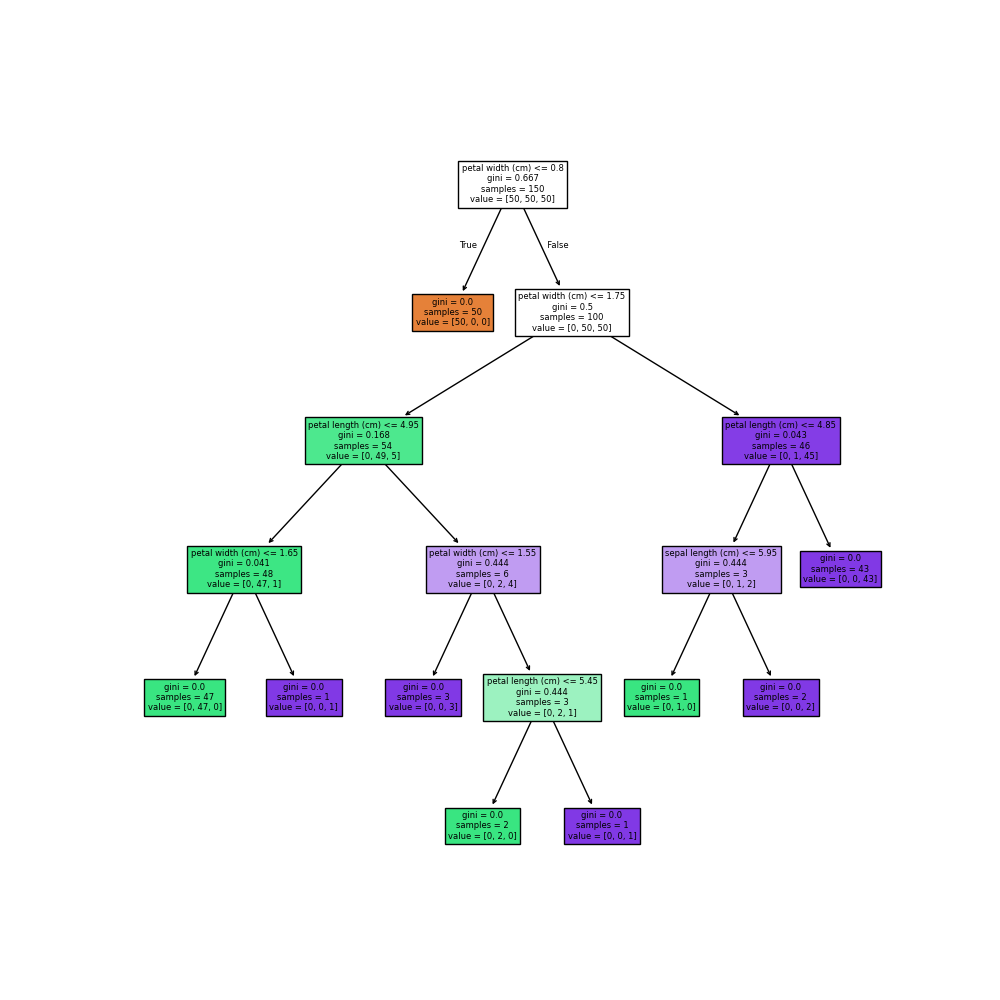

In [41]:
clas = tree.DecisionTreeClassifier()  
iris = load_iris()

X_train = iris.data
y_train = iris.target
clas.fit(X_train, y_train)

plt.figure(figsize=(10, 10)) # Make it large enough to read
tree.plot_tree(clas, filled=True, feature_names=iris.feature_names);
plt.show()

##Classification

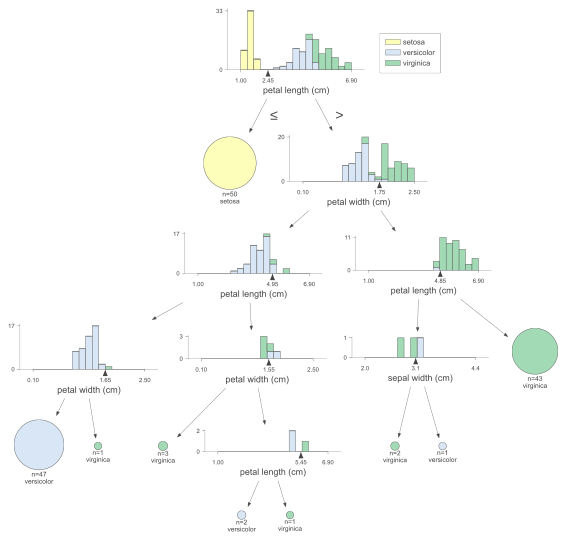

In [4]:
viz = dtreeviz.model(
  clas, 
  X_train,
  y_train,
  feature_names=iris.feature_names, 
  class_names=["setosa", "versicolor", "virginica"]
  )
v = viz.view()
v

## Regression

In [6]:
regr = tree.DecisionTreeRegressor(max_depth=1)
housing = fetch_california_housing()
X_train_regr, y_train_regr = housing.data, housing.target
regr.fit(X_train_regr, y_train_regr)

viz = dtreeviz.model(
  regr,
  X_train_regr,
  y_train_regr,
  target_name='price',
  feature_names=housing.feature_names,
  )
viz.view(scale=2)

## Horizontal Decision Tree

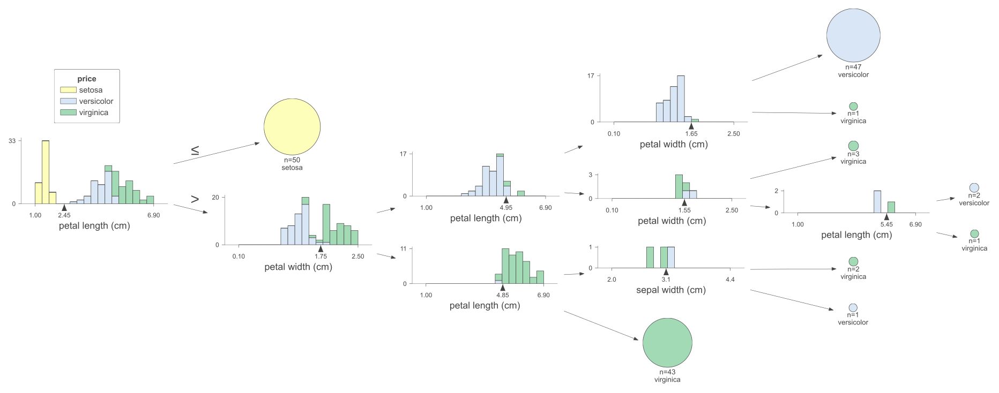

In [8]:
viz = dtreeviz.model(
  clas, 
  X_train,
  y_train,
  target_name='price',
  feature_names=iris.feature_names, 
  class_names=["setosa", "versicolor", "virginica"]
  )
viz.view(scale=2, orientation='LR')

## Show Prediction Path

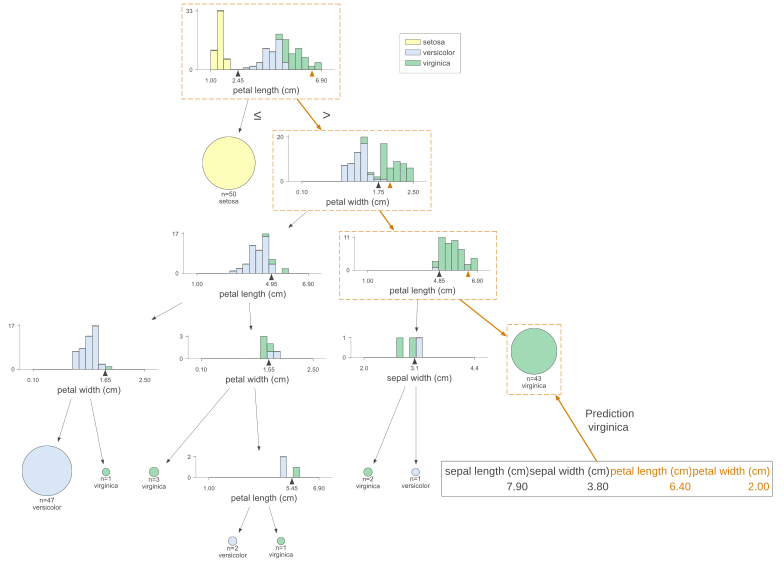

In [10]:
X = iris.data[np.random.randint(0, len(iris.data)),:]

viz = dtreeviz.model(
  clas, 
  X_train,
  y_train,
  feature_names=iris.feature_names, 
  class_names=["setosa", "versicolor", "virginica"]
  )
viz.view(x=X)

## Show Node Number

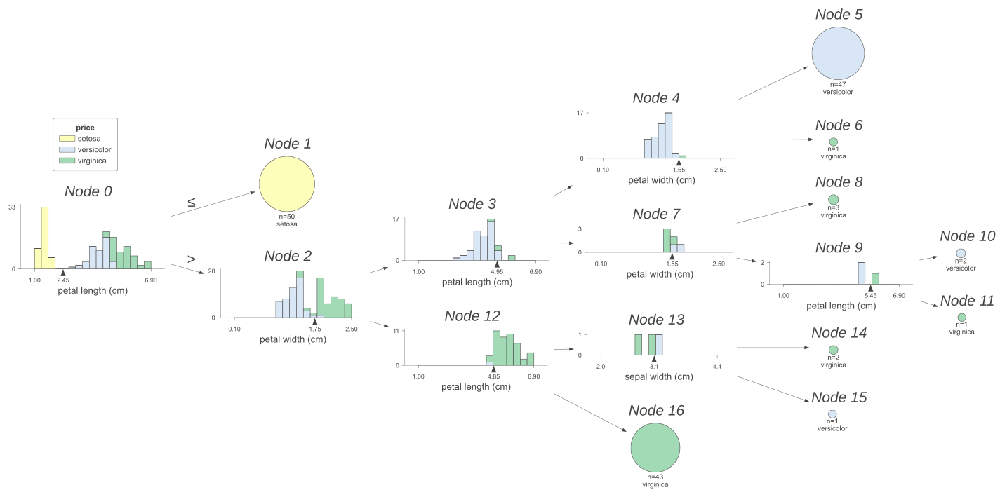

In [12]:
viz = dtreeviz.model(
  clas, 
  X_train,
  y_train,
  target_name='price',
  feature_names=iris.feature_names, 
  class_names=["setosa", "versicolor", "virginica"]
  )
viz.view(  
  scale = 1.5,
  orientation='LR',
  histtype= 'barstacked', 
  show_node_labels=True
  )

##  Without any graphs

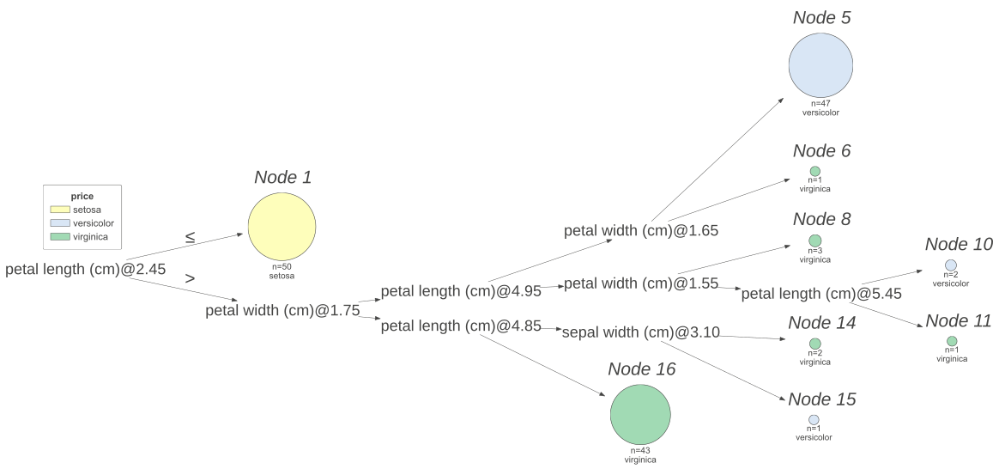

In [14]:
viz = dtreeviz.model(
  clas, 
  X_train,
  y_train,
  target_name='price',
  feature_names=iris.feature_names, 
  class_names=["setosa", "versicolor", "virginica"]
  )
viz.view(  
  scale = 1.5,
  orientation='LR',
  histtype= 'barstacked', 
  show_node_labels=True,
  fancy=False
  )

## Show just prediction path, nothing else

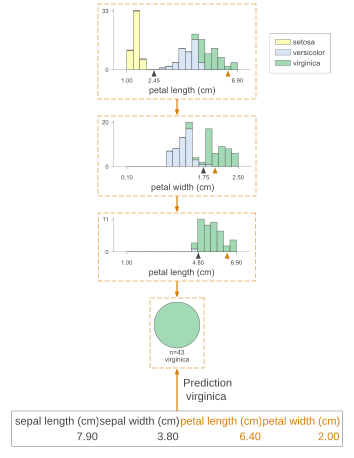

In [16]:
viz = dtreeviz.model(
  clas, 
  X_train,
  y_train,
  feature_names=iris.feature_names, 
  class_names=["setosa", "versicolor", "virginica"]
  )
viz.view(x=X, show_just_path=True)

## Prediction Path in Plain english

In [18]:
print(dtreeviz.explain_prediction_path(clas, X, feature_names=iris.feature_names, explanation_type="plain_english"))

4.85 <= petal length (cm) 
1.75 <= petal width (cm) 



C:\Users\91635\AppData\Local\Temp\ipykernel_23224\368662207.py:1: DeprecationWarning: explain_prediction_path() function is deprecated starting from version 2.0. 
 For the same functionality, please use this code instead: 
 m = dtreeviz.model(...) 
 m.explain_prediction_path()


## Feature Importance

C:\Users\91635\AppData\Local\Temp\ipykernel_23224\791841962.py:1: DeprecationWarning: explain_prediction_path(explanation_type='sklearn_default') function is deprecated starting from version 2.0. 
 For the same functionality, please use this code instead: 
 m = dtreeviz.model(...) 
 m.instance_feature_importance()


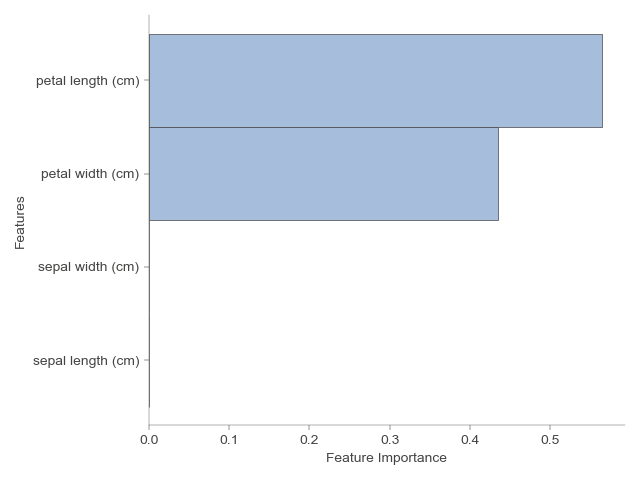

None


In [20]:
print(dtreeviz.explain_prediction_path(clas, X, feature_names=iris.feature_names, explanation_type="sklearn_default"))

## Univariate Regression

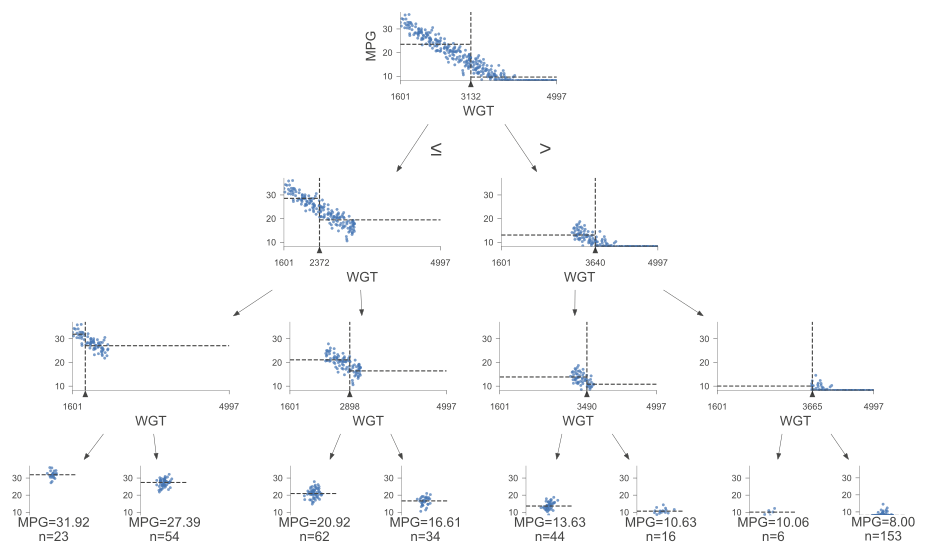

In [23]:
df_cars = pd.read_csv("cars.csv")
X, y = df_cars[['WGT']], df_cars['MPG']

dt = DecisionTreeRegressor(max_depth=3, criterion="absolute_error") 
dt.fit(X.values, y.values) 

viz = dtreeviz.model(dt, X, y, target_name='MPG', feature_names=['WGT'])
viz.view(scale=1.5)

## 3D Biveriate Regression

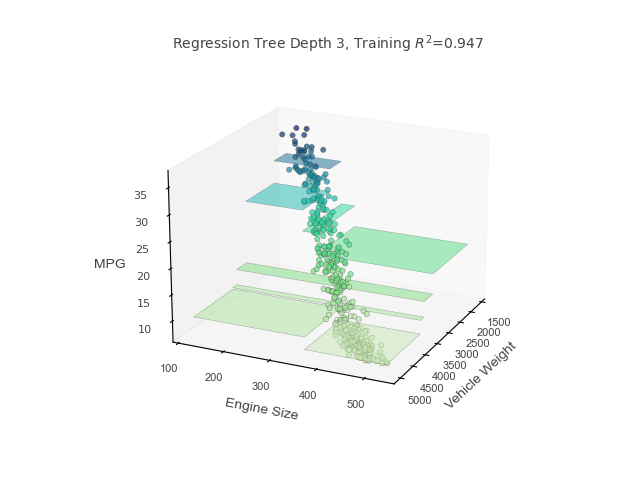

In [26]:
X = df_cars[['WGT','ENG']]
y = df_cars['MPG']
dt = DecisionTreeRegressor(max_depth=3, criterion="absolute_error")
dt.fit(X.values, y.values)

viz_model = dtreeviz.model(
    dt, 
    X_train=X, 
    y_train=y, 
    target_name='MPG', 
    feature_names=['Vehicle Weight', 'Engine Size']
    )

viz_model.rtree_feature_space3D(elev=20, azim=25, show={'splits','title'})
plt.show()